## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import HistGradientBoostingRegressor
import lime
import shap

c:\Users\ABHIROOP\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import warnings
warnings.filterwarnings("ignore")

## Data upload and Preprocessing

In [3]:
data = pd.read_csv("..\data\Kolkata-1973-2024-cleaned.csv", parse_dates=['DATE'], index_col='DATE')
data.head(10)

,DEWP,MAX,MIN,MXSPD,PRCP,TEMP,VISIB,WDSP,Fog,Rain,Snow,Hail,Thunder,Tornado
DATE,,,,,,,,,,,,,,
1973-01-01,66.0,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-02,56.2,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-03,54.9,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-04,51.1,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-05,54.5,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-06,53.9,29.0,12.0,6.3,0.0,20.833333,2.4,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-07,56.5,30.0,13.0,4.6,0.0,21.555556,1.1,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-08,65.6,31.0,18.0,2.9,0.0,24.444444,1.5,0.5,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-09,65.9,33.0,19.0,7.0,0.0,25.333333,1.5,2.9,1.0,0.0,0.0,0.0,0.0,0.0


In [4]:
data.drop(columns=['Snow', 'Hail', 'Tornado'], inplace=True)
data.head()

,DEWP,MAX,MIN,MXSPD,PRCP,TEMP,VISIB,WDSP,Fog,Rain,Thunder
DATE,,,,,,,,,,,
1973-01-01,66.0,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,0.0
1973-01-02,56.2,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,0.0
1973-01-03,54.9,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,0.0
1973-01-04,51.1,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,0.0
1973-01-05,54.5,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,0.0


In [5]:
data.agg(["min", "max", "mean", "std", "median", "skew", "kurtosis"])

,DEWP,MAX,MIN,MXSPD,PRCP,TEMP,VISIB,WDSP,Fog,Rain,Thunder
min,40.700000,15.777778,5.000000,1.000000,0.000000,12.555556,0.400000,0.000000,0.000000,0.000000,0.000000
max,86.400000,47.000000,31.000000,50.900000,383.032000,36.000000,11.000000,27.500000,1.000000,1.000000,1.000000
mean,70.271915,31.832659,21.880585,7.444046,3.925804,26.437762,1.910030,3.422076,0.096442,0.291543,0.200591
std,9.639887,3.942072,5.301742,4.170536,13.637699,4.329855,0.715230,2.339775,0.295204,0.454485,0.400453
median,74.300000,32.388889,24.000000,7.000000,0.000000,27.833333,1.800000,2.900000,0.000000,0.000000,0.000000
skew,-0.705888,-0.443722,-0.756265,2.166170,9.211964,-0.769261,2.410669,1.200809,2.734379,0.917427,1.495507
kurtosis,-0.805495,-0.107674,-0.663609,11.676577,150.083838,-0.393297,13.903059,2.159051,5.477409,-1.158450,0.236567


In [6]:
cols = list(data.columns)
cols1 = [_ + '-1' for _ in cols]
col1 = dict(map(lambda i,j : (i,j) , cols,cols1))
cols2 = [_ + '-2' for _ in cols]
col2 = dict(map(lambda i,j : (i,j) , cols,cols2))
cols3 = [_ + '-3' for _ in cols]
col3 = dict(map(lambda i,j : (i,j) , cols,cols3))
cols4 = [_ + '-4' for _ in cols]
col4 = dict(map(lambda i,j : (i,j) , cols,cols4))
cols5 = [_ + '-5' for _ in cols]
col5 = dict(map(lambda i,j : (i,j) , cols,cols5))
cols6 = [_ + '-6' for _ in cols]
col6 = dict(map(lambda i,j : (i,j) , cols,cols6))
cols7 = [_ + '-7' for _ in cols]
col7 = dict(map(lambda i,j : (i,j) , cols,cols7))
cols8 = [_ + '-7' for _ in cols]
col8 = dict(map(lambda i,j : (i,j) , cols,cols8))
cols9 = [_ + '-9' for _ in cols]
col9 = dict(map(lambda i,j : (i,j) , cols,cols9))
cols10 = [_ + '-10' for _ in cols]
col10 = dict(map(lambda i,j : (i,j) , cols,cols10))

In [7]:
s1 = data[:].shift(+1).rename(columns=col1)
s2 = data[:].shift(+2).rename(columns=col2)
s3 = data[:].shift(+3).rename(columns=col3)
s4 = data[:].shift(+4).rename(columns=col4)
s5 = data[:].shift(+5).rename(columns=col5)
s6 = data[:].shift(+6).rename(columns=col6)
s7 = data[:].shift(+7).rename(columns=col7)
s8 = data[:].shift(+8).rename(columns=col8)
s9 = data[:].shift(+9).rename(columns=col9)
s10 = data[:].shift(+10).rename(columns=col10)
data_input = pd.concat([s1, s2, s3, s4, s5, s6, s7, s8, s9, s10], axis=1)
data_input.head(10)

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,MAX-10,MIN-10,MXSPD-10,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-02,66.0,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-03,56.2,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-04,54.9,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-05,51.1,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-06,54.5,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-07,53.9,29.0,12.0,6.3,0.0,20.833333,2.4,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-08,56.5,30.0,13.0,4.6,0.0,21.555556,1.1,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-09,65.6,31.0,18.0,2.9,0.0,24.444444,1.5,0.5,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
null_locations = data_input.isnull()

# Display rows and columns with NaN values
null_positions = null_locations.stack()[null_locations.stack()]
print(null_positions)

DATE                  
1973-01-01  DEWP-1        True
            MAX-1         True
            MIN-1         True
            MXSPD-1       True
            PRCP-1        True
                          ... 
1973-01-10  VISIB-10      True
            WDSP-10       True
            Fog-10        True
            Rain-10       True
            Thunder-10    True
Length: 605, dtype: bool


In [9]:
data_input.dropna(inplace=True)
data_input.head()

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,MAX-10,MIN-10,MXSPD-10,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-11,62.2,29.0,18.0,7.0,0.0,24.000000,3.0,4.2,0.0,0.0,...,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,0.0
1973-01-12,60.1,29.0,16.0,3.9,0.0,22.888889,2.5,1.3,0.0,0.0,...,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,0.0
1973-01-13,64.6,29.0,17.0,5.8,0.0,23.166667,2.7,3.0,0.0,0.0,...,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,0.0
1973-01-14,65.9,29.0,17.0,8.0,0.0,23.666667,2.6,2.8,0.0,0.0,...,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,0.0
1973-01-15,50.0,27.0,13.0,8.9,0.0,18.722222,2.5,2.0,0.0,0.0,...,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,0.0


In [10]:
data_input['Day of Year'] = data_input.index.day_of_year
data_input['Year'] = data_input.index.year
data_input['Month'] = data_input.index.month
data_input.head()

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10,Day of Year,Year,Month
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-11,62.2,29.0,18.0,7.0,0.0,24.000000,3.0,4.2,0.0,0.0,...,0.0,23.611111,1.7,0.6,0.0,0.0,0.0,11,1973,1
1973-01-12,60.1,29.0,16.0,3.9,0.0,22.888889,2.5,1.3,0.0,0.0,...,0.0,20.777778,2.1,1.9,0.0,0.0,0.0,12,1973,1
1973-01-13,64.6,29.0,17.0,5.8,0.0,23.166667,2.7,3.0,0.0,0.0,...,0.0,20.000000,2.7,1.5,0.0,0.0,0.0,13,1973,1
1973-01-14,65.9,29.0,17.0,8.0,0.0,23.666667,2.6,2.8,0.0,0.0,...,0.0,20.111111,2.8,0.9,0.0,0.0,0.0,14,1973,1
1973-01-15,50.0,27.0,13.0,8.9,0.0,18.722222,2.5,2.0,0.0,0.0,...,0.0,21.333333,2.1,1.8,1.0,0.0,0.0,15,1973,1


In [11]:
data_output = data[['MAX', 'MIN']].loc['1973-01-08':]
data_output

,MAX,MIN
DATE,,
1973-01-08,31.000000,18.000000
1973-01-09,33.000000,19.000000
1973-01-10,29.000000,18.000000
1973-01-11,29.000000,16.000000
1973-01-12,29.000000,17.000000
...,...,...
2024-11-08,32.000000,22.777778
2024-11-09,31.611111,23.000000
2024-11-10,31.777778,21.388889


In [12]:
data_input

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10,Day of Year,Year,Month
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-11,62.2,29.000000,18.000000,7.0,0.0,24.000000,3.0,4.2,0.0,0.0,...,0.0,23.611111,1.7,0.6,0.0,0.0,0.0,11,1973,1
1973-01-12,60.1,29.000000,16.000000,3.9,0.0,22.888889,2.5,1.3,0.0,0.0,...,0.0,20.777778,2.1,1.9,0.0,0.0,0.0,12,1973,1
1973-01-13,64.6,29.000000,17.000000,5.8,0.0,23.166667,2.7,3.0,0.0,0.0,...,0.0,20.000000,2.7,1.5,0.0,0.0,0.0,13,1973,1
1973-01-14,65.9,29.000000,17.000000,8.0,0.0,23.666667,2.6,2.8,0.0,0.0,...,0.0,20.111111,2.8,0.9,0.0,0.0,0.0,14,1973,1
1973-01-15,50.0,27.000000,13.000000,8.9,0.0,18.722222,2.5,2.0,0.0,0.0,...,0.0,21.333333,2.1,1.8,1.0,0.0,0.0,15,1973,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-08,72.8,31.611111,23.888889,6.0,0.0,27.666667,1.8,3.7,0.0,0.0,...,0.0,29.722222,2.0,2.3,0.0,0.0,0.0,313,2024,11
2024-11-09,71.5,32.000000,22.777778,7.0,0.0,27.222222,2.1,4.7,0.0,0.0,...,0.0,29.500000,2.0,4.0,0.0,0.0,0.0,314,2024,11
2024-11-10,70.7,31.611111,23.000000,7.0,0.0,27.055556,2.3,3.8,0.0,0.0,...,0.0,30.000000,2.1,4.0,0.0,0.0,0.0,315,2024,11


## Train-Test Split

In [13]:
train_start = data_input.index[0].date()
train_end = '2014-12-31'
print(f"Training done from {train_start} to {train_end}")

test_start = '2015-01-01'
test_end = data_input.index[-1].date()
print(f"Testing done from {test_start} to {test_end}")

Training done from 1973-01-11 to 2014-12-31
Testing done from 2015-01-01 to 2024-11-12


In [14]:
# Training set
X_train = data_input.loc[train_start:train_end]
y_train = data_output.loc[train_start:train_end]

# Testing set
X_test = data_input.loc[test_start:test_end]
y_test = data_output.loc[test_start:test_end]

In [15]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaler2 = StandardScaler()
y_train_scaled = scaler2.fit_transform(y_train)
y_test_scaled = scaler2.transform(y_test)

In [16]:
def willmott_index(y_true, y_pred):
    """
    Calculates the Willmott Index (WI).
    """
    numerator = np.sum((y_pred - y_true)**2)
    denominator = np.sum( np.abs(y_true - np.mean(y_true)) + np.abs(y_pred - np.mean(y_pred))) 
    return 1-(numerator / denominator)

def percent_bias(y_true, y_pred):
    """
    Calculates the Percent Bias (PBIAS).
    """
    return 100 * np.sum(y_pred - y_true) / np.sum(y_true)

## Linear Regression

In [35]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
pred_lr=model_lr.predict(X_test)

print("Linear Regression - Root Mean Squared Error:", root_mean_squared_error(pred_lr, y_test))
print("Linear Regression - Mean Absolute Error:", mean_absolute_error(pred_lr, y_test))
print("Linear Regression - Mean Absolute Percentage Error:", mean_absolute_percentage_error(pred_lr, y_test))
print("Linear Regression - R2 Score:", r2_score(pred_lr, y_test))
print("Linear Regression - Willmott Index:", willmott_index(np.array(y_test), pred_lr))
print("Linear Regression - Percent Bias:", percent_bias(np.array(y_test), pred_lr))

Linear Regression - Root Mean Squared Error: 1.4937046497635849
Linear Regression - Mean Absolute Error: 1.1007255894306334
Linear Regression - Mean Absolute Percentage Error: 0.042159827276660275
Linear Regression - R2 Score: 0.8676141118021683
Linear Regression - Willmott Index: 0.7824791741586985
Linear Regression - Percent Bias: -0.019072045925809866


In [36]:
for i in range(2):
    print(y_train.columns[i] + "\n")
    coef_pairs = [(X_test.columns[j], model_lr.coef_[i][j].round(5)) for j in range(len(X_test.columns))]
    sorted_coef = sorted(coef_pairs, key=lambda x: x[1], reverse=True)

    for col, coeff in sorted_coef:
        print(col, "=", coeff)
    print()

MAX

TEMP-1 = 0.43121
MAX-1 = 0.37816
Fog-1 = 0.31204
Thunder-7 = 0.137
Thunder-7 = 0.10594
WDSP-2 = 0.10438
Thunder-5 = 0.09636
Rain-10 = 0.08491
VISIB-5 = 0.08328
Thunder-2 = 0.07574
Thunder-6 = 0.07483
Rain-7 = 0.06635
MAX-2 = 0.06609
Rain-2 = 0.0594
MAX-3 = 0.05791
TEMP-7 = 0.04883
MAX-5 = 0.04557
Fog-7 = 0.04338
WDSP-3 = 0.04178
Rain-7 = 0.03841
MAX-10 = 0.0384
MAX-6 = 0.0382
Fog-4 = 0.03684
WDSP-7 = 0.034
VISIB-7 = 0.03245
MAX-4 = 0.02875
MIN-10 = 0.02764
Rain-5 = 0.02743
MAX-7 = 0.0253
MIN-4 = 0.02473
MXSPD-1 = 0.02265
VISIB-3 = 0.02032
MAX-9 = 0.01819
WDSP-5 = 0.01739
TEMP-7 = 0.01563
MIN-3 = 0.01177
MXSPD-10 = 0.0107
WDSP-6 = 0.01032
TEMP-10 = 0.00687
MXSPD-5 = 0.00629
Rain-9 = 0.0057
WDSP-7 = 0.00435
WDSP-9 = 0.004
MIN-9 = 0.00394
DEWP-4 = 0.0037
MXSPD-4 = 0.00359
DEWP-9 = 0.00312
MXSPD-9 = 0.00307
MXSPD-7 = 0.00286
DEWP-1 = 0.00265
PRCP-9 = 0.00262
PRCP-1 = 0.00249
MIN-6 = 0.00236
VISIB-6 = 0.0023
PRCP-4 = 0.00227
MIN-5 = 0.00178
PRCP-3 = 0.00162
PRCP-5 = 0.00156
Year = 0.00

## Decision Tree Regressor

In [37]:
# Decision Tree
param_grid = { 'max_depth': [ 5, 6, 7, 8, 9, 10], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [15, 20, 25, 30, 40, 50, 60, 75, 100]}

model_dt = DecisionTreeRegressor(random_state=0)

grid_search = GridSearchCV(estimator=model_dt, param_grid=param_grid, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

best_model_dt = grid_search.best_estimator_

pred_dt = best_model_dt.predict(X_test)

rmse = root_mean_squared_error(y_test, pred_dt)
mae = mean_absolute_error(y_test, pred_dt)
mape = mean_absolute_percentage_error(y_test, pred_dt)
r2 = r2_score(y_test, pred_dt)
wi = willmott_index(np.array(y_test), pred_dt)
pbi = percent_bias(np.array(y_test), pred_dt)

print("Decision Tree - Best Parameters:", grid_search.best_params_)
print("Decision Tree - Root Mean Squared Error:", rmse)
print("Decision Tree - Mean Absolute Error:", mae)
print("Decision Tree - Mean Absolute Percentage Error:", mape)
print("Decision Tree - R2 Score:", r2)
print("Decision Tree - Willmott Index:", wi)
print("Decision Tree - Percent Bias:", pbi)

Decision Tree - Best Parameters: {'max_depth': 8, 'min_samples_leaf': 50, 'min_samples_split': 2}
Decision Tree - Root Mean Squared Error: 1.6224234052611028
Decision Tree - Mean Absolute Error: 1.2209761955038023
Decision Tree - Mean Absolute Percentage Error: 0.04821763900739646
Decision Tree - R2 Score: 0.8701331906982346
Decision Tree - Willmott Index: 0.7452340128026402
Decision Tree - Percent Bias: -0.4368795406640294


## Gradient Boosting Regressor

In [17]:
model_gbr1 = HistGradientBoostingRegressor(max_iter = 5000)
model_gbr1.fit(X_train, y_train['MAX'])
pred_gbr1 = model_gbr1.predict(X_test)

model_gbr2 = HistGradientBoostingRegressor(max_iter = 5000)
model_gbr2.fit(X_train, y_train['MIN'])
pred_gbr2 =model_gbr2.predict(X_test)

pred_gbr =  np.vstack((pred_gbr1, pred_gbr2)).T

print("Root mean squared error: ",root_mean_squared_error(y_test, pred_gbr))
print("Mean absolute error: ",mean_absolute_error(y_test, pred_gbr))
print("Mean absolute percentage error: ",mean_absolute_percentage_error(y_test, pred_gbr))
print("R2 score: ",r2_score(y_test, pred_gbr))
print("Willmott Index: ",willmott_index(np.array(y_test), pred_gbr))
print("Percent Bias: ",percent_bias(np.array(y_test), pred_gbr))

Root mean squared error:  1.4526338499771998
Mean absolute error:  1.0567139266878194
Mean absolute percentage error:  0.041483701943124916
R2 score:  0.8940175904791441
Willmott Index:  0.7924626575685452
Percent Bias:  0.12795193191198934


In [18]:
import pickle
with open('model_gbr_1_1.pkl', 'wb') as f:
    pickle.dump(model_gbr1, f)
with open('model_gbr_1_2.pkl', 'wb') as f:
    pickle.dump(model_gbr2, f)

### Visualize GBR predictions

In [19]:
import seaborn as sns

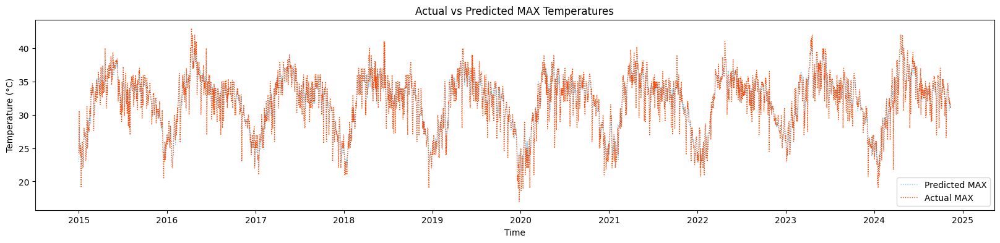

In [20]:
plt.figure(figsize=(20, 4))  
plt.plot(X_test.index, pred_gbr[:, 0], label='Predicted MAX', linewidth=1, linestyle=':', color='skyblue')
plt.plot(X_test.index, y_test['MAX'], label='Actual MAX', linewidth=1, linestyle=':', color='orangered')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (°C)")
plt.title("Actual vs Predicted MAX Temperatures")
plt.show()

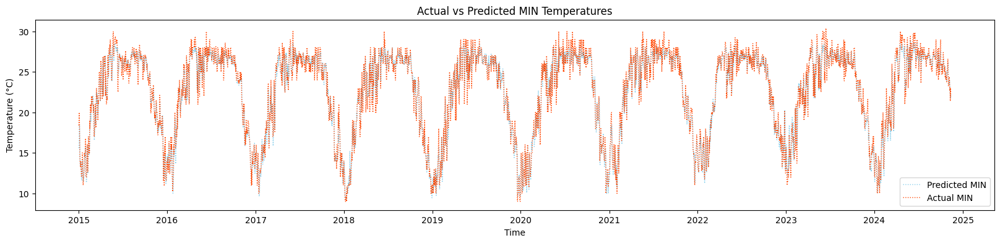

In [ ]:
plt.figure(figsize=(20, 4))
plt.plot(X_test.index, pred_gbr[:, 1], label='Predicted MIN', linewidth=1, linestyle=':', color='skyblue')
plt.plot(X_test.index, y_test['MIN'], label='Actual MIN', linewidth=1, linestyle=':', color='orangered')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (°C)")
plt.title("Actual vs Predicted MIN Temperatures")
plt.show()

In [22]:
pred_gbr_df = pd.DataFrame(pred_gbr, index=y_test.index, columns=['MAX', 'MIN'])

In [23]:
y_test['Month'] = y_test.index.month
pred_gbr_df['Month'] = pred_gbr_df.index.month

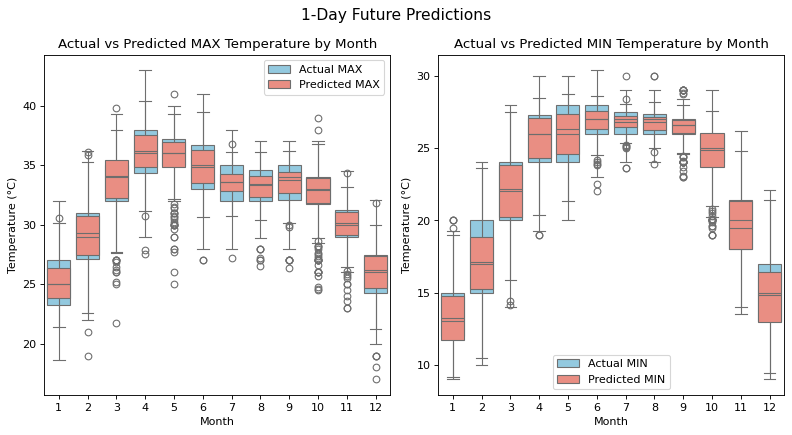

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5.5), dpi=80)
sns.boxplot(x=y_test['Month'], y=y_test['MAX'], ax=ax[0], color='skyblue', label='Actual MAX')
sns.boxplot(x=pred_gbr_df['Month'], y=pred_gbr_df['MAX'], ax=ax[0], color='salmon', label='Predicted MAX')
sns.boxplot(x=y_test['Month'], y=y_test['MIN'], ax=ax[1], color='skyblue', label='Actual MIN')
sns.boxplot(x=pred_gbr_df['Month'], y=pred_gbr_df['MIN'], ax=ax[1], color='salmon', label='Predicted MIN')

ax[0].set_title("Actual vs Predicted MAX Temperature by Month")
ax[1].set_title("Actual vs Predicted MIN Temperature by Month")

for i in range(2): ax[i].set_ylabel("Temperature (°C)")
fig.suptitle("1-Day Future Predictions", fontsize=14)
plt.tight_layout()
plt.show()

## Random Forest Regressor

In [39]:
model_rf = RandomForestRegressor(n_estimators = 200, min_samples_split = 5, min_samples_leaf = 2, max_features = 1.0)
model_rf.fit(X_train, y_train)

pred_rf = model_rf.predict(X_test)

print("Random Forest - Root Mean Squared Error:", root_mean_squared_error(y_test, pred_rf))
print("Random Forest - Mean Absolute Error:", mean_absolute_error(y_test, pred_rf))
print("Random Forest - Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test, pred_rf))
print("Random Forest - R2 Score:", r2_score(y_test, pred_rf))
print("Random Forest - Willmott Index:", willmott_index(np.array(y_test), pred_rf))
print("Random Forest - Percent Bias:", percent_bias(np.array(y_test), pred_rf))

Random Forest - Root Mean Squared Error: 1.5128159620979447
Random Forest - Mean Absolute Error: 1.125502244150249
Random Forest - Mean Absolute Percentage Error: 0.04414609053831907
Random Forest - R2 Score: 0.8865402848341396
Random Forest - Willmott Index: 0.7781904686618359
Random Forest - Percent Bias: -0.4294338643690722


## Bagging Regressor

In [40]:
model_bg = BaggingRegressor(n_estimators = 200, max_features = 1.0, max_samples = 1.0, random_state = 42)
model_bg.fit(X_train, y_train)

pred_bg = model_bg.predict(X_test)

print("Bagging - Root Mean Squared Error:", root_mean_squared_error(y_test, pred_bg))
print("Bagging - Mean Absolute Error:", mean_absolute_error(y_test, pred_bg))
print("Bagging - Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test, pred_bg))
print("Bagging - R2 Score:", r2_score(y_test, pred_bg))
print("Bagging - Willmott Index:", willmott_index(np.array(y_test), pred_bg))
print("Bagging - Percent Bias:", percent_bias(np.array(y_test), pred_bg))

Bagging - Root Mean Squared Error: 1.5188263420026589
Bagging - Mean Absolute Error: 1.1299490567322303
Bagging - Mean Absolute Percentage Error: 0.04429794182725106
Bagging - R2 Score: 0.885613296968225
Bagging - Willmott Index: 0.7762554042110292
Bagging - Percent Bias: -0.4524685754899728


## MLP

In [41]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.regularizers import l2

# Build the model
model = Sequential([
    Dense(1024, activation='elu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=l2(1e-5)),
    Dropout(0.25),
    Dense(512, activation='elu', kernel_regularizer=l2(1e-5)),
    Dropout(0.25),
    Dense(2)])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.Huber(delta=1.0),
              metrics=['mean_absolute_error'])

early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, min_delta=1e-7)
plateau = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train the model with validation split
history = model.fit(X_train_scaled, y_train_scaled,
                    epochs= 200,
                    batch_size= 256,
                    validation_data=(X_test_scaled, y_test_scaled),
                    callbacks=[early_stopping, plateau],
                    verbose=1)

test_loss, test_mae = model.evaluate(X_test_scaled, y_test_scaled)
print("Test Loss (MSE):", test_loss)
print("Test MAE:", test_mae)

pred_ann = model.predict(X_test_scaled)

Epoch 1/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.6075 - mean_absolute_error: 0.9502 - val_loss: 0.0801 - val_mean_absolute_error: 0.2813 - learning_rate: 0.0010
Epoch 2/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1067 - mean_absolute_error: 0.3401 - val_loss: 0.0785 - val_mean_absolute_error: 0.2772 - learning_rate: 0.0010
Epoch 3/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0993 - mean_absolute_error: 0.3269 - val_loss: 0.0811 - val_mean_absolute_error: 0.2737 - learning_rate: 0.0010
Epoch 4/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0911 - mean_absolute_error: 0.3062 - val_loss: 0.0768 - val_mean_absolute_error: 0.2635 - learning_rate: 0.0010
Epoch 5/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0889 - mean_absolute_error: 0.3019 - val_loss: 0.0733 - val_mean_absolute_error: 0.2588 - learning_rate: 0.0010
Epoch 6/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0825 - mean_absolute_error: 0.2884 - val_loss: 0.0729 - val_mean_abs

In [42]:
pred_ann = scaler2.inverse_transform(pred_ann)
rmse = root_mean_squared_error(y_test, pred_ann)
mae = mean_absolute_error(y_test, pred_ann)
mape = mean_absolute_percentage_error(y_test, pred_ann)
r2 = r2_score(y_test, pred_ann)
wi = willmott_index(np.array(y_test), pred_ann)
pbi = percent_bias(np.array(y_test), pred_ann)

# Print evaluation metrics
print("MLP with Dropout - Root Mean Square Error:", rmse)
print("MLP with Dropout - Mean Absolute Error:", mae)
print("MLP with Dropout - Mean Absolute Percentage Error:", mape)
print("MLP with Dropout - R2 Score:", r2)
print("MLP with Dropout - Willmott Index:", wi)
print("MLP with Dropout - Percent Bias:", pbi)

MLP with Dropout - Root Mean Square Error: 1.4743369817733765
MLP with Dropout - Mean Absolute Error: 1.076400637626648
MLP with Dropout - Mean Absolute Percentage Error: 0.042143430560827255
MLP with Dropout - R2 Score: 0.8904016017913818
MLP with Dropout - Willmott Index: 0.7882356126859118
MLP with Dropout - Percent Bias: 0.27092860304668326


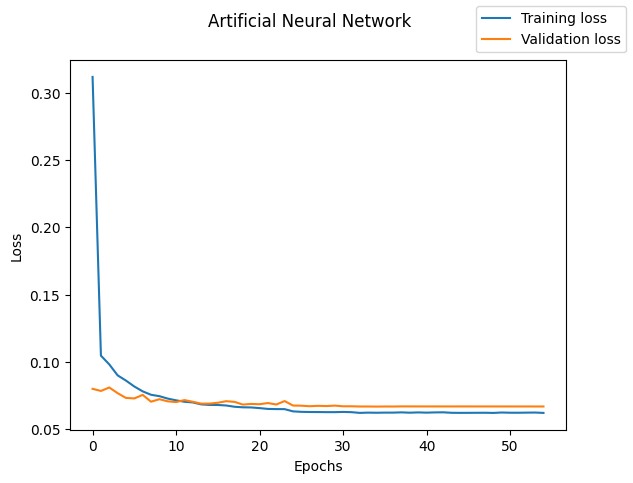

In [43]:
fig = plt.figure()
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
fig.legend()
fig.suptitle('Artificial Neural Network')
plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.show()

In [44]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 1024)           │       116,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,927,688 (7.35 MB)

 Trainable params: 642,562 (2.45 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,285,126 (4.90 MB)

In [ ]:
tf.keras.utils.plot_model(model, to_file='model_plot.pdf', show_shapes=True, show_layer_names=True)

## LIME

In [26]:
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train.to_numpy(), feature_names=list(X_train.keys()), verbose=True, mode='regression')

### For Winter

In [27]:
explr_max = explainer.explain_instance(X_test.loc['2024-1-10'], model_gbr1.predict, num_features=X_test.columns.size)
explr_min = explainer.explain_instance(X_test.loc['2024-1-10'], model_gbr2.predict, num_features=X_test.columns.size)

Intercept 32.75046739481614
Prediction_local [28.41607405]
Right: 25.141261576720296
Intercept 25.181085569186404
Prediction_local [15.03913557]
Right: 13.81991315199223


In [28]:
explr_min.show_in_notebook(show_table=True)

In [29]:
explr_max.show_in_notebook(show_table=True)

### For Summer

In [30]:
explr_max = explainer.explain_instance(X_test.loc['2024-05-1'], model_gbr1.predict, num_features=X_test.columns.size)
explr_min = explainer.explain_instance(X_test.loc['2024-05-1'], model_gbr2.predict, num_features=X_test.columns.size)

Intercept 30.447436537957042
Prediction_local [35.21272407]
Right: 34.76352260224301
Intercept 21.327036598629157
Prediction_local [27.61718789]
Right: 27.06274638487187


In [31]:
explr_min.show_in_notebook(show_table=True)

In [32]:
explr_max.show_in_notebook(show_table=True)

### For Monsoon

In [33]:
explr_max = explainer.explain_instance(X_test.loc['2024-08-1'], model_gbr1.predict, num_features=X_test.columns.size)
explr_min = explainer.explain_instance(X_test.loc['2024-08-1'], model_gbr2.predict, num_features=X_test.columns.size)

Intercept 31.380232846922212
Prediction_local [34.83969096]
Right: 34.068584445105216
Intercept 21.339478697134886
Prediction_local [27.87808978]
Right: 26.762807948171776


In [34]:
explr_min.show_in_notebook(show_table=True)

In [35]:
explr_max.show_in_notebook(show_table=True)

## SHAP

### Max Temperature

In [36]:
X1000 = shap.utils.sample(X_train, 1000) 
explainer_shap = shap.Explainer(model_gbr1.predict, X1000)
shap_value= explainer_shap(X_test)

PermutationExplainer explainer: 3605it [17:45,  3.38it/s]                          


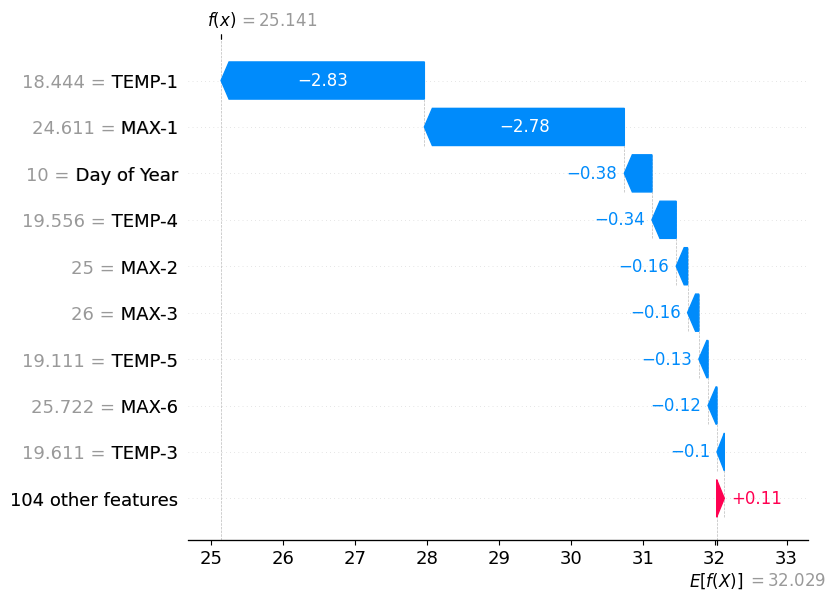

In [37]:
shap.plots.waterfall(shap_value[X_test.index.get_loc('2024-1-10')])

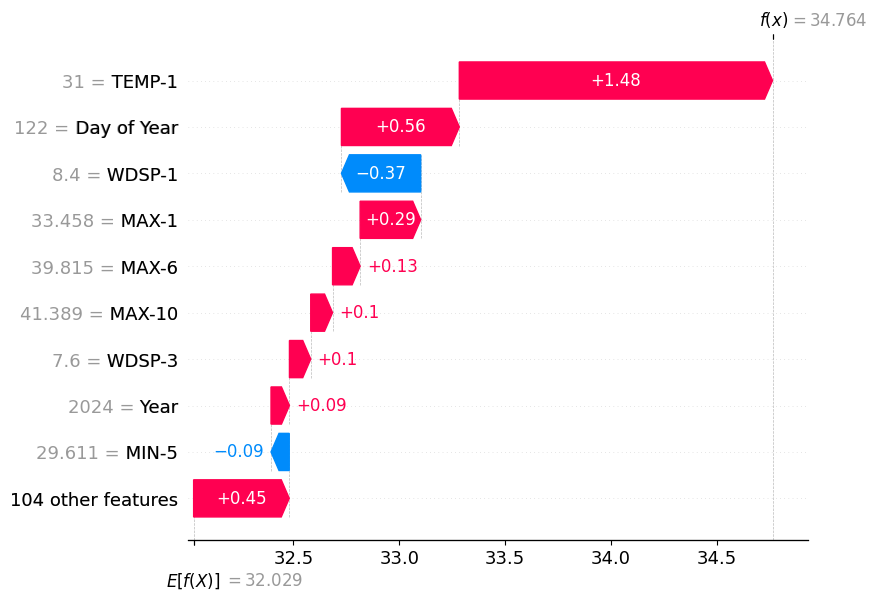

In [38]:
shap.plots.waterfall(shap_value[X_test.index.get_loc('2024-05-1')])

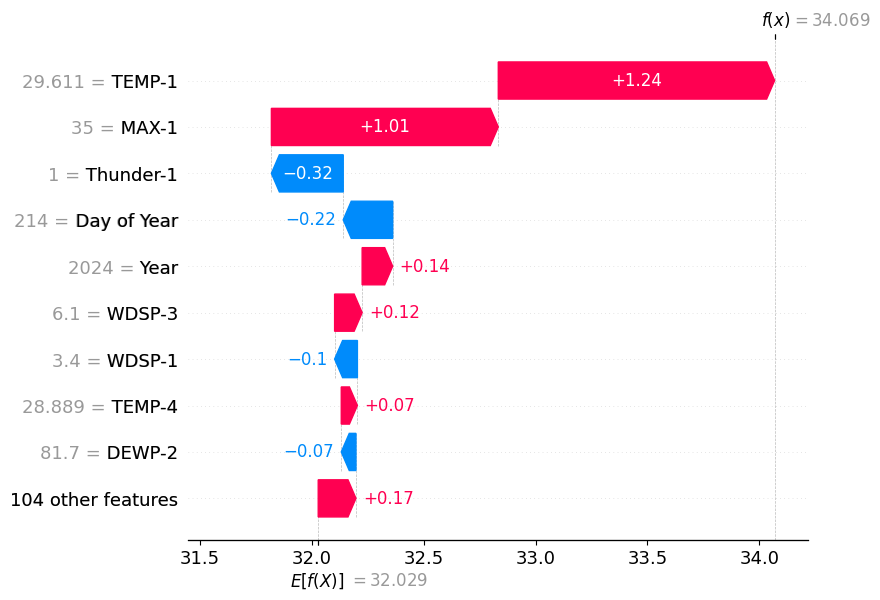

In [39]:
shap.plots.waterfall(shap_value[X_test.index.get_loc('2024-08-1')])

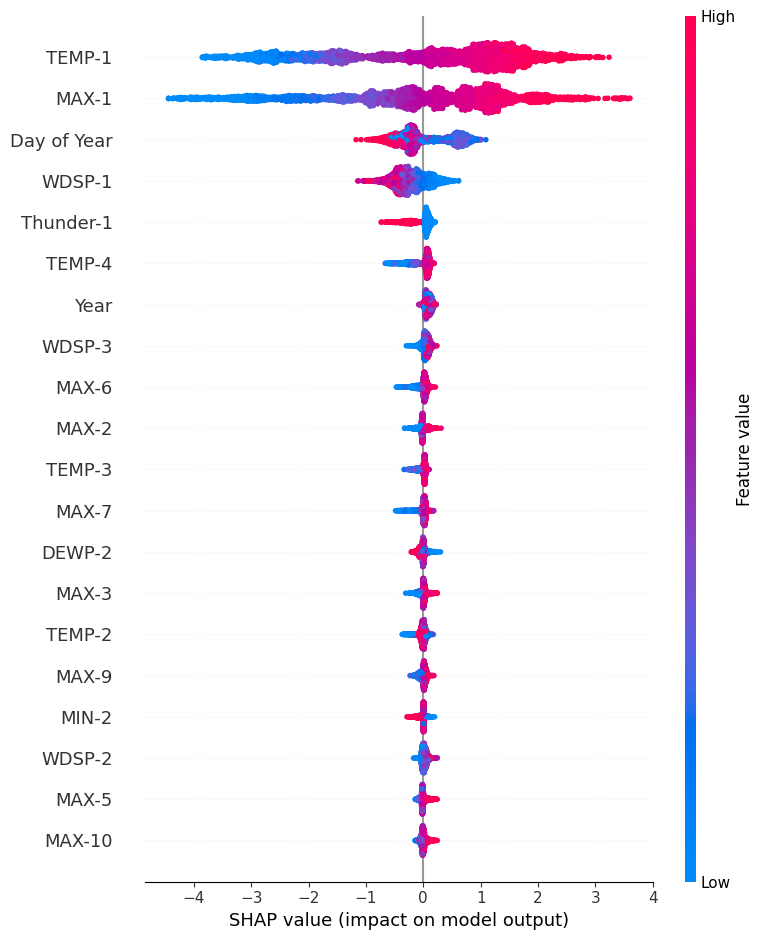

In [40]:
shap.summary_plot(shap_value, X_test)

### Min Temperature

In [41]:
explainer_shap = shap.Explainer(model_gbr2.predict, X1000)
shap_value2= explainer_shap(X_test)

PermutationExplainer explainer: 3605it [27:33,  2.16it/s]                           


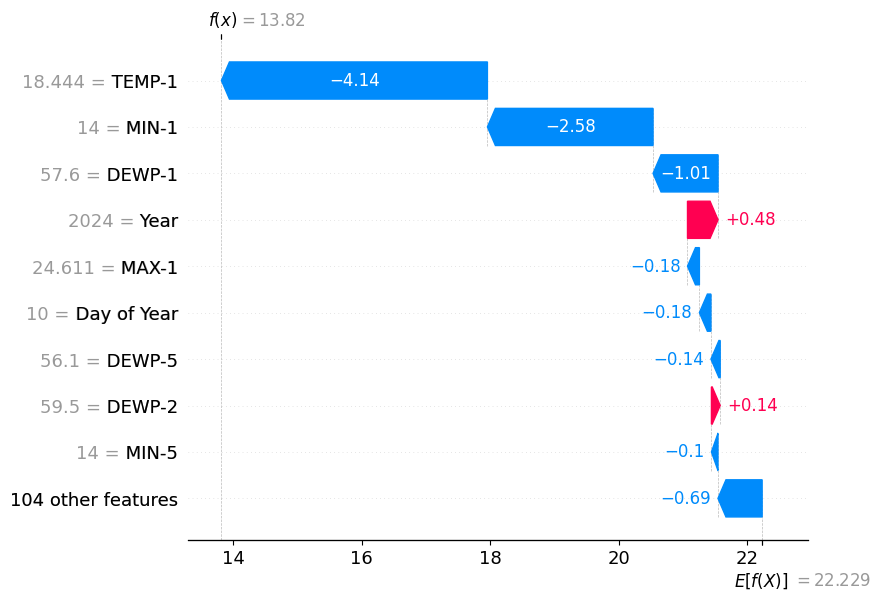

In [42]:
shap.plots.waterfall(shap_value2[X_test.index.get_loc('2024-1-10')])

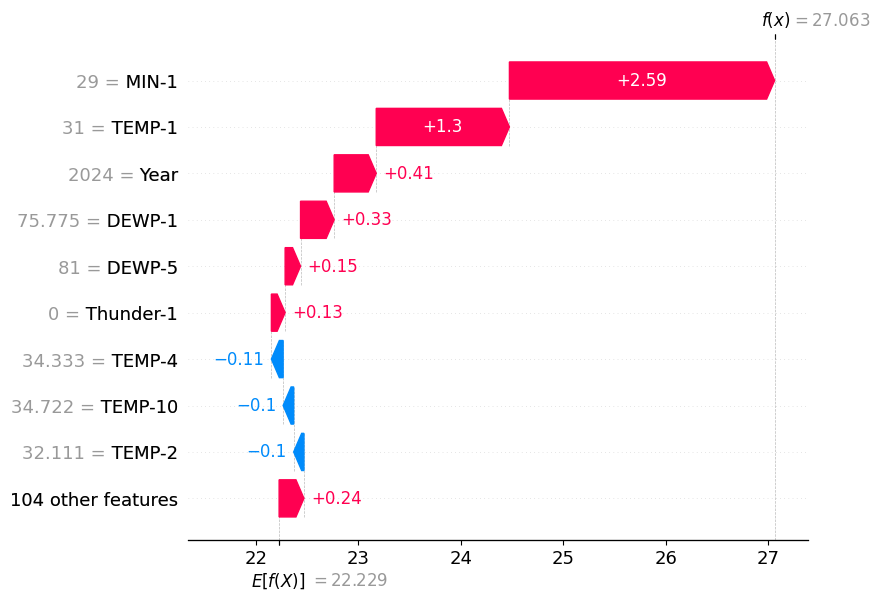

In [43]:
shap.plots.waterfall(shap_value2[X_test.index.get_loc('2024-05-1')])

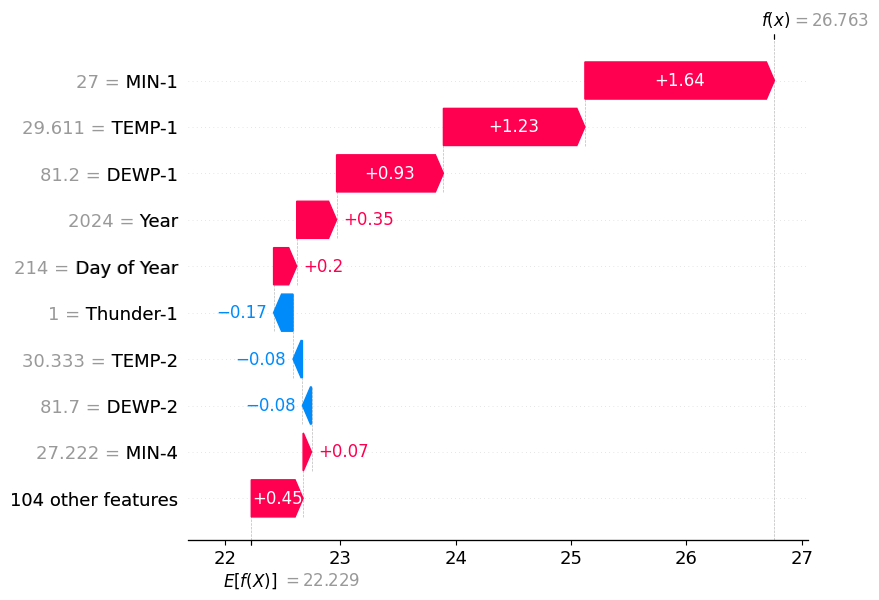

In [44]:
shap.plots.waterfall(shap_value2[X_test.index.get_loc('2024-08-1')])

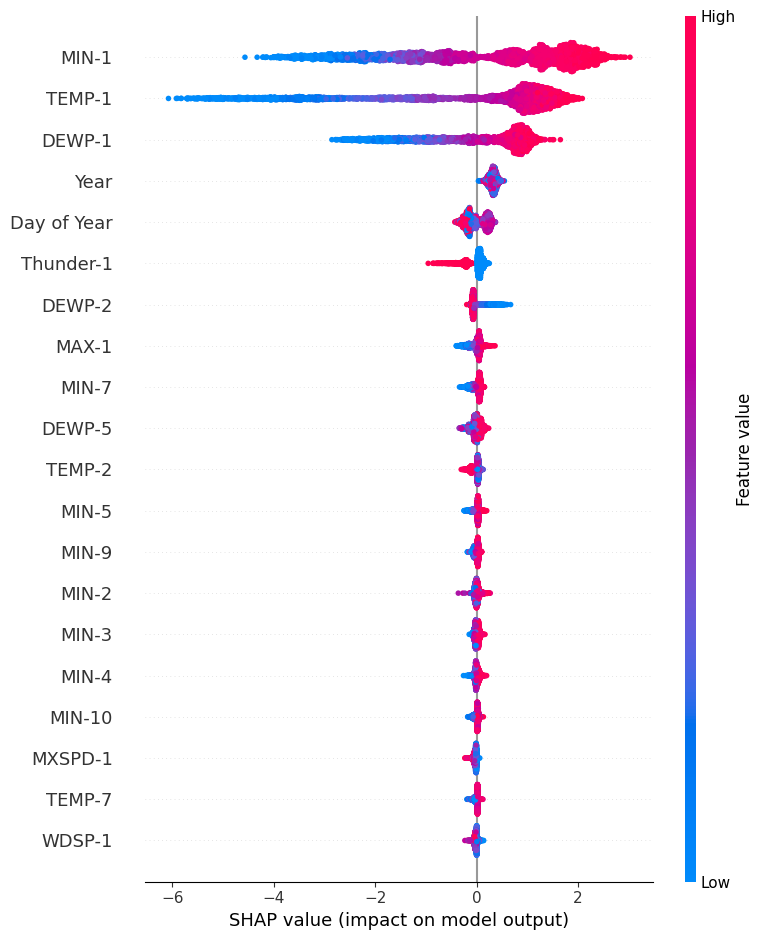

In [45]:
shap.summary_plot(shap_value2, X_test)

## SHAP for MLP

In [24]:
pred_ann[:, 0]

array([24.14041 , 24.123495, 26.809238, ..., 31.67922 , 31.651148,
       31.505781], dtype=float32)

In [20]:
X1000 = shap.utils.sample(X_train, 1000) 
explainer_shap = shap.Explainer(model.predict, X1000)
shap_value_mlp= explainer_shap(X_test[-365:])

507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step


PermutationExplainer explainer:   0%|          | 1/365 [00:00<?, ?it/s]

506/506 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
506/506 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   1%|          | 3/365 [00:14<13:13,  2.19s/it]

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   1%|          | 4/365 [00:19<18:29,  3.07s/it]

506/506 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
506/506 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   1%|▏         | 5/365 [00:23<21:40,  3.61s/it]

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   2%|▏         | 6/365 [00:28<24:04,  4.02s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   2%|▏         | 7/365 [00:32<24:12,  4.06s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   2%|▏         | 8/365 [00:36<24:15,  4.08s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   2%|▏         | 9/365 [00:40<24:25,  4.12s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   3%|▎         | 10/365 [00:45<25:11,  4.26s/it]

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:   3%|▎         | 11/365 [00:50<27:02,  4.58s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   3%|▎         | 12/365 [00:55<26:26,  4.49s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   4%|▎         | 13/365 [00:59<26:13,  4.47s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   4%|▍         | 14/365 [01:04<26:08,  4.47s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   4%|▍         | 15/365 [01:08<25:34,  4.38s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   4%|▍         | 16/365 [01:12<25:17,  4.35s/it]

508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   5%|▍         | 17/365 [01:16<25:02,  4.32s/it]

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   5%|▍         | 18/365 [01:20<24:31,  4.24s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   5%|▌         | 19/365 [01:24<24:26,  4.24s/it]

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   5%|▌         | 20/365 [01:29<24:39,  4.29s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   6%|▌         | 21/365 [01:33<24:25,  4.26s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   6%|▌         | 22/365 [01:37<24:04,  4.21s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   6%|▋         | 23/365 [01:41<23:47,  4.17s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   7%|▋         | 24/365 [01:46<24:03,  4.23s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   7%|▋         | 25/365 [01:50<24:10,  4.27s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   7%|▋         | 26/365 [01:54<23:53,  4.23s/it]

522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   7%|▋         | 27/365 [01:58<23:49,  4.23s/it]

523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   8%|▊         | 28/365 [02:03<23:50,  4.24s/it]

525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   8%|▊         | 29/365 [02:08<25:14,  4.51s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   8%|▊         | 30/365 [02:12<24:41,  4.42s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:   8%|▊         | 31/365 [02:16<24:21,  4.38s/it]

521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   9%|▉         | 32/365 [02:21<24:21,  4.39s/it]

522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   9%|▉         | 33/365 [02:25<24:17,  4.39s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:   9%|▉         | 34/365 [02:29<23:54,  4.33s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  10%|▉         | 35/365 [02:34<23:40,  4.31s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  10%|▉         | 36/365 [02:38<23:22,  4.26s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  10%|█         | 37/365 [02:42<23:13,  4.25s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  10%|█         | 38/365 [02:47<24:28,  4.49s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  11%|█         | 39/365 [02:53<27:08,  4.99s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  11%|█         | 40/365 [02:57<25:49,  4.77s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  11%|█         | 41/365 [03:01<24:37,  4.56s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  12%|█▏        | 42/365 [03:06<23:48,  4.42s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  12%|█▏        | 43/365 [03:10<23:06,  4.31s/it]

519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  12%|█▏        | 44/365 [03:14<22:46,  4.26s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
323/323 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  12%|█▏        | 45/365 [03:18<22:33,  4.23s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  13%|█▎        | 46/365 [03:22<22:23,  4.21s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  13%|█▎        | 47/365 [03:26<22:13,  4.19s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  13%|█▎        | 48/365 [03:30<22:04,  4.18s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  13%|█▎        | 49/365 [03:35<22:03,  4.19s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  14%|█▎        | 50/365 [03:39<21:52,  4.17s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  14%|█▍        | 51/365 [03:43<22:10,  4.24s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  14%|█▍        | 52/365 [03:47<22:04,  4.23s/it]

508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  15%|█▍        | 53/365 [03:52<23:02,  4.43s/it]

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  15%|█▍        | 54/365 [03:56<22:22,  4.32s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  15%|█▌        | 55/365 [04:01<22:22,  4.33s/it]

508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  15%|█▌        | 56/365 [04:05<21:55,  4.26s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  16%|█▌        | 57/365 [04:09<21:38,  4.22s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 58/365 [04:13<21:26,  4.19s/it]

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  16%|█▌        | 59/365 [04:17<21:13,  4.16s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  16%|█▋        | 60/365 [04:21<21:00,  4.13s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  17%|█▋        | 61/365 [04:25<20:50,  4.11s/it]

519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  17%|█▋        | 62/365 [04:29<20:50,  4.13s/it]

523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  17%|█▋        | 63/365 [04:34<20:56,  4.16s/it]

528/528 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
528/528 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  18%|█▊        | 64/365 [04:38<20:54,  4.17s/it]

535/535 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
535/535 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  18%|█▊        | 65/365 [04:42<21:01,  4.20s/it]

536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 66/365 [04:46<21:15,  4.27s/it]

546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  18%|█▊        | 67/365 [04:51<21:26,  4.32s/it]

558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  19%|█▊        | 68/365 [04:55<21:35,  4.36s/it]

555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  19%|█▉        | 69/365 [05:00<21:42,  4.40s/it]

561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  19%|█▉        | 70/365 [05:04<21:40,  4.41s/it]

561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  19%|█▉        | 71/365 [05:09<21:39,  4.42s/it]

557/557 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
557/557 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  20%|█▉        | 72/365 [05:13<21:36,  4.42s/it]

557/557 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
557/557 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  20%|██        | 73/365 [05:17<21:23,  4.40s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  20%|██        | 74/365 [05:22<21:23,  4.41s/it]

564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  21%|██        | 75/365 [05:26<21:24,  4.43s/it]

565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  21%|██        | 76/365 [05:31<21:27,  4.45s/it]

554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  21%|██        | 77/365 [05:35<21:19,  4.44s/it]

540/540 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
540/540 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  21%|██▏       | 78/365 [05:40<21:11,  4.43s/it]

537/537 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
537/537 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 79/365 [05:44<21:03,  4.42s/it]

538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  22%|██▏       | 80/365 [05:48<20:53,  4.40s/it]

547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  22%|██▏       | 81/365 [05:53<20:50,  4.40s/it]

549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  22%|██▏       | 82/365 [05:57<20:39,  4.38s/it]

555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  23%|██▎       | 83/365 [06:02<20:41,  4.40s/it]

551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  23%|██▎       | 84/365 [06:06<20:40,  4.42s/it]

546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  23%|██▎       | 85/365 [06:11<20:37,  4.42s/it]

544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  24%|██▎       | 86/365 [06:15<20:32,  4.42s/it]

544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  24%|██▍       | 87/365 [06:19<20:25,  4.41s/it]

544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
544/544 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  24%|██▍       | 88/365 [06:24<20:54,  4.53s/it]

546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  24%|██▍       | 89/365 [06:28<20:35,  4.48s/it]

541/541 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
541/541 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  25%|██▍       | 90/365 [06:33<20:39,  4.51s/it]

534/534 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
534/534 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  25%|██▍       | 91/365 [06:37<20:16,  4.44s/it]

526/526 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
526/526 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 92/365 [06:42<20:15,  4.45s/it]

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 93/365 [06:46<19:52,  4.38s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 94/365 [06:51<20:37,  4.57s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 95/365 [06:56<20:23,  4.53s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  26%|██▋       | 96/365 [07:00<19:56,  4.45s/it]

508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  27%|██▋       | 97/365 [07:04<19:25,  4.35s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
323/323 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 98/365 [07:08<19:29,  4.38s/it]

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  27%|██▋       | 99/365 [07:13<19:29,  4.40s/it]

506/506 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
506/506 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
316/316 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  27%|██▋       | 100/365 [07:18<19:53,  4.50s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 101/365 [07:24<22:24,  5.09s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 102/365 [07:29<22:29,  5.13s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  28%|██▊       | 103/365 [07:34<21:36,  4.95s/it]

520/520 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
520/520 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 104/365 [07:38<21:01,  4.83s/it]

522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 105/365 [07:43<20:45,  4.79s/it]

523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 106/365 [07:47<20:14,  4.69s/it]

523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  29%|██▉       | 107/365 [07:52<19:44,  4.59s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  30%|██▉       | 108/365 [07:56<19:18,  4.51s/it]

525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 109/365 [08:01<19:05,  4.47s/it]

523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  30%|███       | 110/365 [08:05<18:44,  4.41s/it]

520/520 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
520/520 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  30%|███       | 111/365 [08:09<18:45,  4.43s/it]

521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  31%|███       | 112/365 [08:13<18:21,  4.36s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  31%|███       | 113/365 [08:18<18:11,  4.33s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  31%|███       | 114/365 [08:27<24:11,  5.78s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 115/365 [08:34<25:23,  6.09s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  32%|███▏      | 116/365 [08:39<23:48,  5.74s/it]

508/508 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
508/508 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  32%|███▏      | 117/365 [08:50<31:08,  7.53s/it]

508/508 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
508/508 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 118/365 [08:59<32:22,  7.86s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 119/365 [09:04<28:48,  7.03s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  33%|███▎      | 120/365 [09:15<33:08,  8.12s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  33%|███▎      | 121/365 [09:22<31:48,  7.82s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 122/365 [09:27<28:00,  6.92s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  34%|███▎      | 123/365 [09:32<25:28,  6.32s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  34%|███▍      | 124/365 [09:37<24:16,  6.04s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  34%|███▍      | 125/365 [09:45<26:15,  6.56s/it]

534/534 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
534/534 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step


PermutationExplainer explainer:  35%|███▍      | 126/365 [10:00<37:07,  9.32s/it]

542/542 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step
542/542 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 127/365 [10:08<34:57,  8.81s/it]

546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
546/546 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


PermutationExplainer explainer:  35%|███▌      | 128/365 [10:15<32:00,  8.10s/it]

551/551 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
551/551 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  35%|███▌      | 129/365 [10:24<33:49,  8.60s/it]

558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  36%|███▌      | 130/365 [10:31<31:17,  7.99s/it]

569/569 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
569/569 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 131/365 [10:37<29:01,  7.44s/it]

576/576 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
576/576 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 132/365 [10:43<27:36,  7.11s/it]

574/574 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
574/574 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  36%|███▋      | 133/365 [10:50<26:33,  6.87s/it]

575/575 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
575/575 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 134/365 [10:56<25:23,  6.60s/it]

573/573 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
573/573 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 135/365 [11:02<24:39,  6.43s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 136/365 [11:07<23:46,  6.23s/it]

560/560 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
560/560 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 137/365 [11:14<23:38,  6.22s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 138/365 [11:21<24:19,  6.43s/it]

554/554 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 139/365 [11:26<22:55,  6.09s/it]

548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  38%|███▊      | 140/365 [11:30<21:08,  5.64s/it]

533/533 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
533/533 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  39%|███▊      | 141/365 [11:35<19:49,  5.31s/it]

526/526 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
526/526 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 142/365 [11:39<18:41,  5.03s/it]

527/527 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
527/527 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 143/365 [11:44<17:58,  4.86s/it]

527/527 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
527/527 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 144/365 [11:48<17:26,  4.73s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 145/365 [11:53<16:58,  4.63s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  40%|████      | 146/365 [11:57<16:33,  4.54s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
323/323 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  40%|████      | 147/365 [12:01<16:10,  4.45s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  41%|████      | 148/365 [12:06<15:57,  4.41s/it]

521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  41%|████      | 149/365 [12:10<15:58,  4.44s/it]

522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
522/522 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  41%|████      | 150/365 [12:14<15:40,  4.38s/it]

521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  41%|████▏     | 151/365 [12:19<15:42,  4.41s/it]

521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 152/365 [12:23<15:54,  4.48s/it]

521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
521/521 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  42%|████▏     | 153/365 [12:28<15:41,  4.44s/it]

519/519 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  42%|████▏     | 154/365 [12:33<16:17,  4.63s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  42%|████▏     | 155/365 [12:37<15:53,  4.54s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 156/365 [12:42<15:49,  4.54s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  43%|████▎     | 157/365 [12:46<15:33,  4.49s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  43%|████▎     | 158/365 [12:50<15:21,  4.45s/it]

509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
509/509 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  44%|████▎     | 159/365 [12:55<15:13,  4.44s/it]

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  44%|████▍     | 160/365 [12:59<15:02,  4.40s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 161/365 [13:03<14:50,  4.37s/it]

512/512 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
512/512 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  44%|████▍     | 162/365 [13:08<14:38,  4.33s/it]

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  45%|████▍     | 163/365 [13:12<14:31,  4.31s/it]

513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  45%|████▍     | 164/365 [13:16<14:25,  4.30s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
327/327 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 165/365 [13:21<14:54,  4.47s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  45%|████▌     | 166/365 [13:25<14:40,  4.43s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 167/365 [13:30<14:32,  4.41s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  46%|████▌     | 168/365 [13:34<14:29,  4.41s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
322/322 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  46%|████▋     | 169/365 [13:39<14:27,  4.43s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  47%|████▋     | 170/365 [13:43<14:15,  4.39s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  47%|████▋     | 171/365 [13:47<14:07,  4.37s/it]

515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
515/515 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  47%|████▋     | 172/365 [13:52<14:06,  4.39s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  47%|████▋     | 173/365 [13:56<14:00,  4.38s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 174/365 [14:00<13:57,  4.39s/it]

517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
517/517 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 175/365 [14:05<13:50,  4.37s/it]

516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
516/516 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  48%|████▊     | 176/365 [14:09<13:40,  4.34s/it]

525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  48%|████▊     | 177/365 [14:13<13:33,  4.33s/it]

535/535 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
535/535 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  49%|████▉     | 178/365 [14:18<13:34,  4.35s/it]

536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  49%|████▉     | 179/365 [14:22<13:31,  4.36s/it]

544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
544/544 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  49%|████▉     | 180/365 [14:27<13:30,  4.38s/it]

545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  50%|████▉     | 181/365 [14:31<13:32,  4.41s/it]

549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  50%|████▉     | 182/365 [14:36<13:31,  4.44s/it]

545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  50%|█████     | 183/365 [14:40<13:31,  4.46s/it]

545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
545/545 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  50%|█████     | 184/365 [14:45<13:40,  4.53s/it]

554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  51%|█████     | 185/365 [14:49<13:34,  4.53s/it]

554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
554/554 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  51%|█████     | 186/365 [14:54<13:33,  4.55s/it]

548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  51%|█████     | 187/365 [14:58<13:25,  4.53s/it]

536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  52%|█████▏    | 188/365 [15:03<13:17,  4.51s/it]

545/545 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  52%|█████▏    | 189/365 [15:08<13:21,  4.56s/it]

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  52%|█████▏    | 190/365 [15:12<13:18,  4.56s/it]

542/542 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
542/542 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  52%|█████▏    | 191/365 [15:17<13:06,  4.52s/it]

546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  53%|█████▎    | 192/365 [15:21<13:02,  4.53s/it]

552/552 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
552/552 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  53%|█████▎    | 193/365 [15:26<13:02,  4.55s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  53%|█████▎    | 194/365 [15:30<12:57,  4.55s/it]

545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  53%|█████▎    | 195/365 [15:35<12:56,  4.57s/it]

547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  54%|█████▎    | 196/365 [15:39<12:52,  4.57s/it]

555/555 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  54%|█████▍    | 197/365 [15:44<12:59,  4.64s/it]

565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 198/365 [15:50<13:28,  4.84s/it]

561/561 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
561/561 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 199/365 [15:59<16:52,  6.10s/it]

559/559 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
559/559 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  55%|█████▍    | 200/365 [16:06<18:00,  6.55s/it]

567/567 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
567/567 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  55%|█████▌    | 201/365 [16:14<18:51,  6.90s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  55%|█████▌    | 202/365 [16:28<24:18,  8.95s/it]

571/571 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
571/571 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


PermutationExplainer explainer:  56%|█████▌    | 203/365 [16:40<27:10, 10.06s/it]

565/565 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
565/565 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 204/365 [16:48<24:56,  9.29s/it]

567/567 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
567/567 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 205/365 [16:53<21:16,  7.98s/it]

576/576 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
576/576 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  56%|█████▋    | 206/365 [16:58<19:18,  7.29s/it]

566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 207/365 [17:04<17:31,  6.66s/it]

564/564 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  57%|█████▋    | 208/365 [17:08<15:57,  6.10s/it]

558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 209/365 [17:15<16:08,  6.21s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 210/365 [17:20<15:20,  5.94s/it]

551/551 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 211/365 [17:26<15:00,  5.85s/it]

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
539/539 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 212/365 [17:31<14:38,  5.74s/it]

532/532 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
532/532 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  58%|█████▊    | 213/365 [17:36<13:57,  5.51s/it]

536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
536/536 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  59%|█████▊    | 214/365 [17:41<13:11,  5.24s/it]

538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 215/365 [17:45<12:33,  5.02s/it]

529/529 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
529/529 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 216/365 [17:50<12:19,  4.97s/it]

529/529 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
529/529 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 217/365 [17:55<12:11,  4.94s/it]

519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  60%|█████▉    | 218/365 [18:00<11:48,  4.82s/it]

519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
519/519 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  60%|██████    | 219/365 [18:04<11:33,  4.75s/it]

524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
524/524 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  60%|██████    | 220/365 [18:08<11:08,  4.61s/it]

525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  61%|██████    | 221/365 [18:13<10:56,  4.56s/it]

534/534 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
534/534 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
331/331 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  61%|██████    | 222/365 [18:18<11:10,  4.69s/it]

533/533 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
533/533 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  61%|██████    | 223/365 [18:23<11:13,  4.74s/it]

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  61%|██████▏   | 224/365 [18:27<11:00,  4.68s/it]

538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  62%|██████▏   | 225/365 [18:32<10:47,  4.62s/it]

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  62%|██████▏   | 226/365 [18:36<10:34,  4.57s/it]

539/539 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  62%|██████▏   | 227/365 [18:42<11:03,  4.81s/it]

538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  62%|██████▏   | 228/365 [18:47<11:38,  5.10s/it]

547/547 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
547/547 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 229/365 [18:55<13:28,  5.95s/it]

548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  63%|██████▎   | 230/365 [19:00<12:33,  5.58s/it]

559/559 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
559/559 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  63%|██████▎   | 231/365 [19:06<12:25,  5.56s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  64%|██████▎   | 232/365 [19:11<12:30,  5.64s/it]

573/573 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
573/573 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


PermutationExplainer explainer:  64%|██████▍   | 233/365 [19:21<15:22,  6.99s/it]

572/572 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step
572/572 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  64%|██████▍   | 234/365 [19:32<17:21,  7.95s/it]

580/580 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  64%|██████▍   | 235/365 [19:37<15:16,  7.05s/it]

584/584 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  65%|██████▍   | 236/365 [19:41<13:42,  6.38s/it]

585/585 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
585/585 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  65%|██████▍   | 237/365 [19:46<12:41,  5.95s/it]

593/593 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
593/593 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  65%|██████▌   | 238/365 [19:51<11:47,  5.57s/it]

590/590 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
590/590 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  65%|██████▌   | 239/365 [19:56<11:12,  5.34s/it]

582/582 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
582/582 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  66%|██████▌   | 240/365 [20:01<10:43,  5.15s/it]

572/572 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
572/572 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  66%|██████▌   | 241/365 [20:05<10:21,  5.01s/it]

564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  66%|██████▋   | 242/365 [20:10<10:01,  4.89s/it]

557/557 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
557/557 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 243/365 [20:15<09:54,  4.87s/it]

555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 244/365 [20:19<09:44,  4.83s/it]

552/552 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
552/552 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 245/365 [20:26<10:28,  5.23s/it]

553/553 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
553/553 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 246/365 [20:32<10:48,  5.45s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  68%|██████▊   | 247/365 [20:37<10:48,  5.50s/it]

559/559 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
559/559 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  68%|██████▊   | 248/365 [20:43<10:45,  5.52s/it]

560/560 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
560/560 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  68%|██████▊   | 249/365 [20:49<10:50,  5.61s/it]

565/565 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
565/565 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  68%|██████▊   | 250/365 [20:54<10:51,  5.67s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  69%|██████▉   | 251/365 [21:00<10:38,  5.60s/it]

576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  69%|██████▉   | 252/365 [21:05<10:07,  5.38s/it]

582/582 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
582/582 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  69%|██████▉   | 253/365 [21:10<09:51,  5.28s/it]

578/578 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
578/578 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  70%|██████▉   | 254/365 [21:14<09:15,  5.00s/it]

577/577 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
577/577 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  70%|██████▉   | 255/365 [21:18<08:44,  4.77s/it]

576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  70%|███████   | 256/365 [21:23<08:21,  4.60s/it]

576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  70%|███████   | 257/365 [21:27<08:00,  4.45s/it]

575/575 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
575/575 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  71%|███████   | 258/365 [21:31<07:42,  4.32s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  71%|███████   | 259/365 [21:35<07:29,  4.24s/it]

572/572 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
572/572 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  71%|███████   | 260/365 [21:39<07:19,  4.19s/it]

578/578 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
578/578 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  72%|███████▏  | 261/365 [21:43<07:18,  4.22s/it]

583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  72%|███████▏  | 262/365 [21:47<07:16,  4.23s/it]

577/577 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
577/577 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  72%|███████▏  | 263/365 [21:51<07:07,  4.19s/it]

575/575 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
575/575 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  72%|███████▏  | 264/365 [21:56<07:05,  4.21s/it]

579/579 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
579/579 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  73%|███████▎  | 265/365 [22:00<07:02,  4.23s/it]

589/589 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
589/589 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  73%|███████▎  | 266/365 [22:04<06:56,  4.20s/it]

587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  73%|███████▎  | 267/365 [22:08<06:52,  4.21s/it]

586/586 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
586/586 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  73%|███████▎  | 268/365 [22:13<06:50,  4.24s/it]

590/590 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
590/590 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  74%|███████▎  | 269/365 [22:17<06:45,  4.22s/it]

588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 270/365 [22:21<06:52,  4.34s/it]

584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  74%|███████▍  | 271/365 [22:26<06:41,  4.28s/it]

579/579 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
579/579 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  75%|███████▍  | 272/365 [22:30<06:33,  4.24s/it]

587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
587/587 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  75%|███████▍  | 273/365 [22:34<06:37,  4.32s/it]

591/591 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
591/591 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  75%|███████▌  | 274/365 [22:38<06:31,  4.30s/it]

585/585 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
585/585 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  75%|███████▌  | 275/365 [22:43<06:26,  4.29s/it]

586/586 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
586/586 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  76%|███████▌  | 276/365 [22:47<06:16,  4.23s/it]

585/585 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
585/585 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  76%|███████▌  | 277/365 [22:51<06:08,  4.18s/it]

588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  76%|███████▌  | 278/365 [22:55<06:02,  4.16s/it]

583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  76%|███████▋  | 279/365 [22:59<05:59,  4.17s/it]

580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  77%|███████▋  | 280/365 [23:03<05:50,  4.12s/it]

585/585 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
585/585 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  77%|███████▋  | 281/365 [23:08<05:54,  4.22s/it]

587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  77%|███████▋  | 282/365 [23:12<05:51,  4.24s/it]

581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  78%|███████▊  | 283/365 [23:16<05:46,  4.23s/it]

583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  78%|███████▊  | 284/365 [23:20<05:42,  4.23s/it]

589/589 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
589/589 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  78%|███████▊  | 285/365 [23:24<05:36,  4.20s/it]

588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  78%|███████▊  | 286/365 [23:29<05:31,  4.19s/it]

584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  79%|███████▊  | 287/365 [23:33<05:30,  4.23s/it]

587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
587/587 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  79%|███████▉  | 288/365 [23:37<05:23,  4.21s/it]

594/594 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
594/594 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  79%|███████▉  | 289/365 [23:41<05:21,  4.23s/it]

595/595 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
595/595 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  79%|███████▉  | 290/365 [23:46<05:19,  4.26s/it]

593/593 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
593/593 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  80%|███████▉  | 291/365 [23:50<05:12,  4.22s/it]

583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
583/583 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  80%|████████  | 292/365 [23:54<05:04,  4.17s/it]

582/582 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
582/582 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  80%|████████  | 293/365 [23:58<04:59,  4.16s/it]

573/573 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
573/573 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  81%|████████  | 294/365 [24:02<04:54,  4.15s/it]

569/569 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
569/569 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  81%|████████  | 295/365 [24:06<04:47,  4.11s/it]

563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  81%|████████  | 296/365 [24:10<04:43,  4.10s/it]

560/560 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
560/560 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  81%|████████▏ | 297/365 [24:14<04:38,  4.09s/it]

564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
564/564 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  82%|████████▏ | 298/365 [24:18<04:31,  4.05s/it]

555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
555/555 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  82%|████████▏ | 299/365 [24:22<04:25,  4.02s/it]

551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  82%|████████▏ | 300/365 [24:26<04:19,  3.99s/it]

548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
548/548 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  82%|████████▏ | 301/365 [24:30<04:14,  3.98s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  83%|████████▎ | 302/365 [24:34<04:08,  3.95s/it]

563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  83%|████████▎ | 303/365 [24:38<04:06,  3.97s/it]

569/569 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
569/569 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  83%|████████▎ | 304/365 [24:42<04:06,  4.05s/it]

576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
576/576 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  84%|████████▎ | 305/365 [24:47<04:06,  4.11s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 306/365 [24:51<04:07,  4.19s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 307/365 [24:56<04:18,  4.46s/it]

565/565 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 308/365 [25:01<04:24,  4.64s/it]

569/569 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
569/569 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  85%|████████▍ | 309/365 [25:06<04:30,  4.83s/it]

571/571 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
571/571 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 310/365 [25:13<04:57,  5.41s/it]

575/575 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
575/575 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  85%|████████▌ | 311/365 [25:19<04:54,  5.45s/it]

567/567 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
567/567 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  85%|████████▌ | 312/365 [25:24<04:41,  5.30s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 313/365 [25:29<04:30,  5.20s/it]

550/550 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
550/550 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 314/365 [25:34<04:23,  5.17s/it]

542/542 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
542/542 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  86%|████████▋ | 315/365 [25:39<04:15,  5.12s/it]

549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
332/332 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 316/365 [25:43<04:06,  5.02s/it]

550/550 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
550/550 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 317/365 [25:48<03:56,  4.93s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 318/365 [25:53<03:49,  4.89s/it]

558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  87%|████████▋ | 319/365 [25:57<03:33,  4.63s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  88%|████████▊ | 320/365 [26:01<03:19,  4.42s/it]

562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  88%|████████▊ | 321/365 [26:05<03:09,  4.31s/it]

573/573 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
573/573 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  88%|████████▊ | 322/365 [26:09<03:04,  4.28s/it]

573/573 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
573/573 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  88%|████████▊ | 323/365 [26:13<02:58,  4.24s/it]

569/569 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
569/569 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  89%|████████▉ | 324/365 [26:19<03:11,  4.67s/it]

574/574 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
574/574 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  89%|████████▉ | 325/365 [26:23<03:00,  4.52s/it]

578/578 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
578/578 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  89%|████████▉ | 326/365 [26:27<02:51,  4.40s/it]

580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  90%|████████▉ | 327/365 [26:31<02:43,  4.30s/it]

580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  90%|████████▉ | 328/365 [26:36<02:39,  4.30s/it]

581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  90%|█████████ | 329/365 [26:40<02:32,  4.25s/it]

584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
584/584 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  90%|█████████ | 330/365 [26:44<02:26,  4.20s/it]

588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  91%|█████████ | 331/365 [26:50<02:43,  4.80s/it]

580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
580/580 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  91%|█████████ | 332/365 [26:54<02:32,  4.62s/it]

590/590 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
590/590 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  91%|█████████ | 333/365 [26:58<02:23,  4.48s/it]

595/595 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
595/595 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  92%|█████████▏| 334/365 [27:02<02:14,  4.35s/it]

581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  92%|█████████▏| 335/365 [27:07<02:08,  4.29s/it]

581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
581/581 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  92%|█████████▏| 336/365 [27:11<02:02,  4.22s/it]

579/579 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
579/579 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  92%|█████████▏| 337/365 [27:15<02:00,  4.30s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  93%|█████████▎| 338/365 [27:19<01:54,  4.24s/it]

558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  93%|█████████▎| 339/365 [27:23<01:48,  4.18s/it]

549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
549/549 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  93%|█████████▎| 340/365 [27:27<01:42,  4.10s/it]

545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
545/545 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  93%|█████████▎| 341/365 [27:31<01:36,  4.04s/it]

551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
551/551 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  94%|█████████▎| 342/365 [27:35<01:35,  4.14s/it]

552/552 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
552/552 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  94%|█████████▍| 343/365 [27:39<01:29,  4.06s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  94%|█████████▍| 344/365 [27:43<01:25,  4.07s/it]

556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  95%|█████████▍| 345/365 [27:47<01:21,  4.06s/it]

546/546 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
546/546 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  95%|█████████▍| 346/365 [27:53<01:27,  4.61s/it]

554/554 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
554/554 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
340/340 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


PermutationExplainer explainer:  95%|█████████▌| 347/365 [28:02<01:43,  5.73s/it]

561/561 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


PermutationExplainer explainer:  95%|█████████▌| 348/365 [28:10<01:48,  6.35s/it]

572/572 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
572/572 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  96%|█████████▌| 349/365 [28:14<01:31,  5.69s/it]

577/577 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
577/577 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
338/338 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  96%|█████████▌| 350/365 [28:18<01:18,  5.23s/it]

570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
570/570 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  96%|█████████▌| 351/365 [28:22<01:08,  4.93s/it]

559/559 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
559/559 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  96%|█████████▋| 352/365 [28:26<01:00,  4.67s/it]

547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  97%|█████████▋| 353/365 [28:30<00:53,  4.47s/it]

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  97%|█████████▋| 354/365 [28:34<00:47,  4.34s/it]

538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  97%|█████████▋| 355/365 [28:38<00:42,  4.23s/it]

540/540 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
540/540 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  98%|█████████▊| 356/365 [28:42<00:37,  4.12s/it]

530/530 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
530/530 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  98%|█████████▊| 357/365 [28:46<00:32,  4.07s/it]

525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  98%|█████████▊| 358/365 [28:50<00:28,  4.01s/it]

518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
518/518 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  98%|█████████▊| 359/365 [28:54<00:23,  3.94s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  99%|█████████▊| 360/365 [28:57<00:19,  3.89s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
335/335 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  99%|█████████▉| 361/365 [29:01<00:15,  3.86s/it]

512/512 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
512/512 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  99%|█████████▉| 362/365 [29:05<00:11,  3.83s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer:  99%|█████████▉| 363/365 [29:09<00:07,  3.82s/it]

511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
329/329 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer: 100%|█████████▉| 364/365 [29:12<00:03,  3.80s/it]

514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
514/514 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer: 100%|██████████| 365/365 [29:16<00:00,  3.78s/it]

512/512 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
512/512 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


PermutationExplainer explainer: 366it [29:20,  4.82s/it]                         


In [22]:
shap_value_mlp

.values =
array([[[-1.14928615e-02, -3.28391144e-01],
        [-2.14261346e-01, -2.93226814e-02],
        [ 4.31220186e-02, -1.55205960e-01],
        ...,
        [-3.17396327e+00, -2.20051833e+00],
        [-1.98694202e-01,  1.48581727e-01],
        [-7.81090653e-02, -2.27663398e-02]],

       [[-1.33944046e-02, -3.39338179e-01],
        [-2.13467360e-01, -2.86225033e-02],
        [ 4.34307230e-02, -1.54534698e-01],
        ...,
        [-3.21476388e+00, -2.21460346e+00],
        [-1.98620356e-01,  1.48552268e-01],
        [-7.76547587e-02, -2.24926090e-02]],

       [[-1.59164011e-02, -3.90994005e-01],
        [-2.12914875e-01, -2.85868120e-02],
        [ 2.07214129e-02, -7.74260235e-02],
        ...,
        [-3.24133665e+00, -2.23098134e+00],
        [-1.98764279e-01,  1.47986622e-01],
        [-7.79258049e-02, -2.26321220e-02]],

       ...,

       [[-6.86271191e-04,  7.36242056e-03],
        [-7.08008039e-02, -8.06891918e-03],
        [-2.50791895e-02,  7.51829815e-02],
        

In [37]:
shap_value_mlp.values[:,:,0]

array([[-1.14928615e-02, -2.14261346e-01,  4.31220186e-02, ...,
        -3.17396327e+00, -1.98694202e-01, -7.81090653e-02],
       [-1.33944046e-02, -2.13467360e-01,  4.34307230e-02, ...,
        -3.21476388e+00, -1.98620356e-01, -7.76547587e-02],
       [-1.59164011e-02, -2.12914875e-01,  2.07214129e-02, ...,
        -3.24133665e+00, -1.98764279e-01, -7.79258049e-02],
       ...,
       [-6.86271191e-04, -7.08008039e-02, -2.50791895e-02, ...,
        -3.10851190e+00, -2.04897383e-01, -7.75835037e-02],
       [-9.06398892e-03, -3.16184175e-02,  1.12356508e-02, ...,
        -3.13980391e+00, -2.05524735e-01, -7.68896449e-02],
       [-3.49465847e-03, -2.14234073e-01, -2.53091097e-02, ...,
        -3.16700377e+00, -2.05391240e-01, -7.69720662e-02]])

In [38]:
shap_value_mlp.values

array([[[-1.14928615e-02, -3.28391144e-01],
        [-2.14261346e-01, -2.93226814e-02],
        [ 4.31220186e-02, -1.55205960e-01],
        ...,
        [-3.17396327e+00, -2.20051833e+00],
        [-1.98694202e-01,  1.48581727e-01],
        [-7.81090653e-02, -2.27663398e-02]],

       [[-1.33944046e-02, -3.39338179e-01],
        [-2.13467360e-01, -2.86225033e-02],
        [ 4.34307230e-02, -1.54534698e-01],
        ...,
        [-3.21476388e+00, -2.21460346e+00],
        [-1.98620356e-01,  1.48552268e-01],
        [-7.76547587e-02, -2.24926090e-02]],

       [[-1.59164011e-02, -3.90994005e-01],
        [-2.12914875e-01, -2.85868120e-02],
        [ 2.07214129e-02, -7.74260235e-02],
        ...,
        [-3.24133665e+00, -2.23098134e+00],
        [-1.98764279e-01,  1.47986622e-01],
        [-7.79258049e-02, -2.26321220e-02]],

       ...,

       [[-6.86271191e-04,  7.36242056e-03],
        [-7.08008039e-02, -8.06891918e-03],
        [-2.50791895e-02,  7.51829815e-02],
        ...,
     

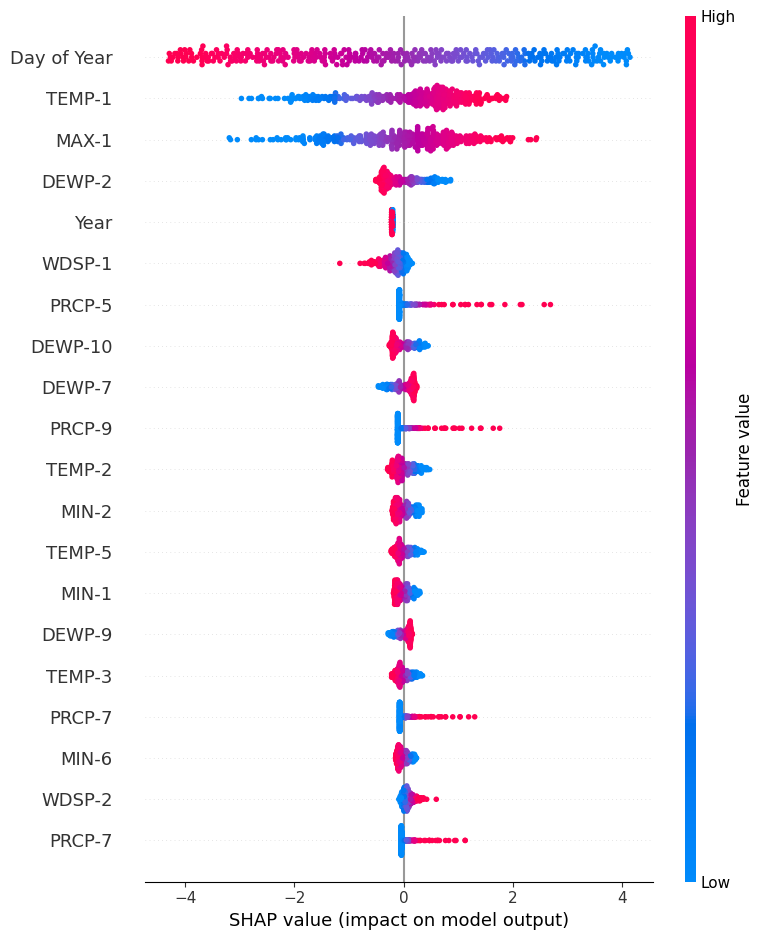

In [39]:
shap.summary_plot(shap_value_mlp.values[:,:,0], X_test[-365:])

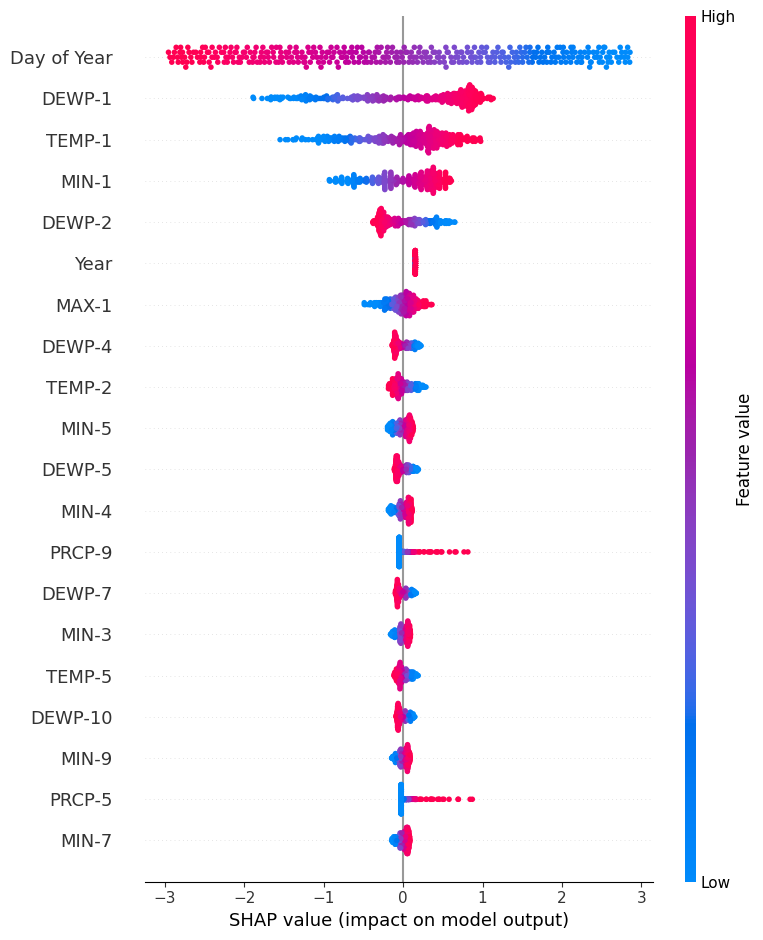

In [41]:
shap.summary_plot(shap_value_mlp.values[:,:,1], X_test[-365:])